In [1]:
import datajoint as dj
from churchland_pipeline_python import action, acquisition, equipment, lab, processing, reference # OR from churchland_pipeline_python import *
from churchland_pipeline_python.utilities import datajointutils, dataviz
from pacman_pipeline_python import pacman_acquisition, pacman_behavior, pacman_brain, pacman_muscle, pacman_processing
from pacman_pipeline_python.utilities import autopopulate

%load_ext autoreload
%autoreload 2

Connecting njm2149@datajoint.u19motor.zi.columbia.edu:3306


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import colorcet as cc

## ERDs

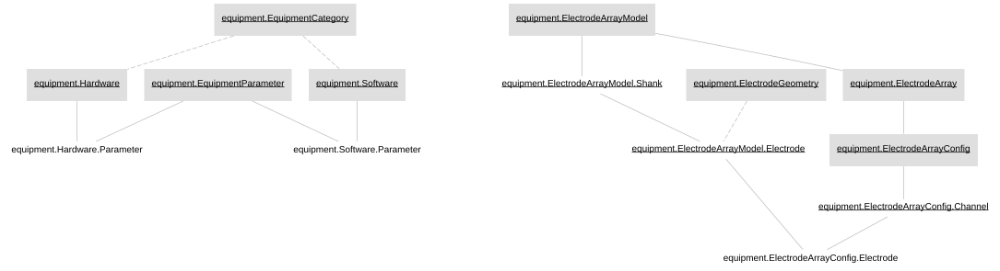

In [3]:
dj.ERD(equipment)

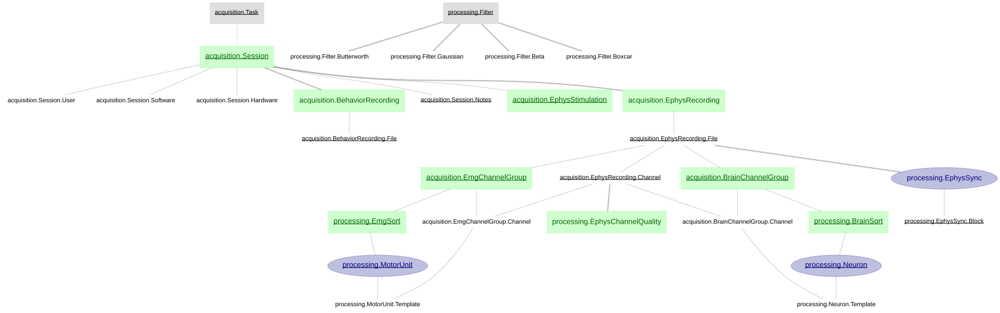

In [4]:
dj.ERD(acquisition) + dj.ERD(processing)

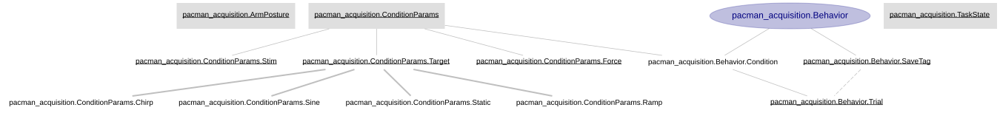

In [5]:
dj.ERD(pacman_acquisition)

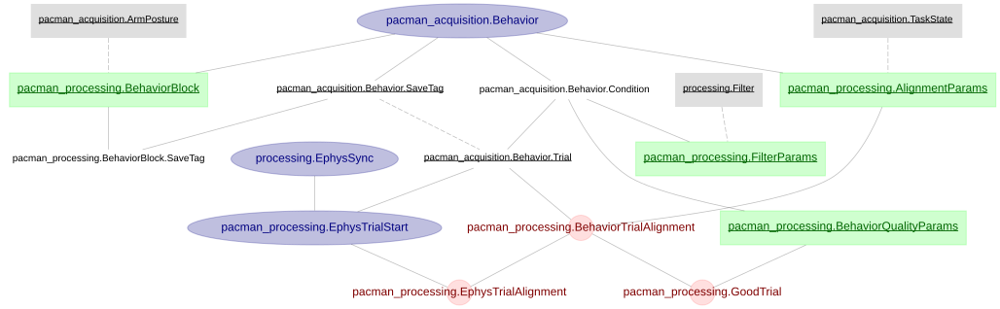

In [9]:
dj.ERD(pacman_processing)-1

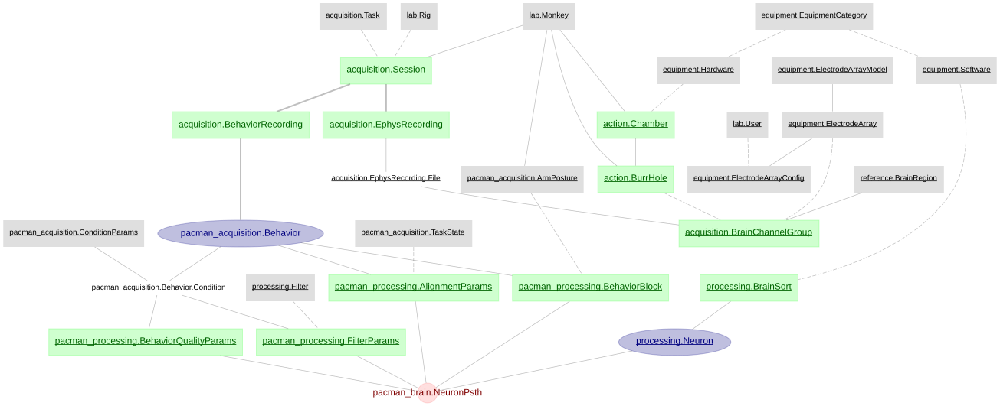

In [7]:
dj.ERD(pacman_brain.NeuronPsth) - 10

## Querying tables

In [10]:
# default is 12
dj.config['display.limit'] = 4

In [11]:
# list all recording sessions
acquisition.Session()

session_date session date,monkey monkey name,rig rig name,task task name,task_version task version,"session_problem session problem. If True, session is excluded from analyses","session_problem_description session problem description (e.g., corrupted data)"
2018-04-13,Cousteau,Jumanji,pacman,1.0,0,
2018-04-20,Cousteau,Jumanji,pacman,1.0,0,
2018-06-15,Cousteau,Jumanji,pacman,1.0,0,
2018-06-22,Cousteau,Jumanji,pacman,1.0,0,


In [12]:
# sessions with behavior and ephys recordings
acquisition.Session & acquisition.BehaviorRecording & acquisition.EphysRecording

session_date session date,monkey monkey name,rig rig name,task task name,task_version task version,"session_problem session problem. If True, session is excluded from analyses","session_problem_description session problem description (e.g., corrupted data)"
2018-04-13,Cousteau,Jumanji,pacman,1.0,0,
2018-04-20,Cousteau,Jumanji,pacman,1.0,0,
2018-06-15,Cousteau,Jumanji,pacman,1.0,0,
2018-06-22,Cousteau,Jumanji,pacman,1.0,0,


In [13]:
# sessions with behavior recording and without ephys recordings
acquisition.Session & acquisition.BehaviorRecording - acquisition.EphysRecording

session_date session date,monkey monkey name,rig rig name,task task name,task_version task version,"session_problem session problem. If True, session is excluded from analyses","session_problem_description session problem description (e.g., corrupted data)"
2018-07-12,Cousteau,Jumanji,pacman,1.0,0,


In [15]:
# sessions with sorted neurons and motor units
acquisition.Session & processing.Neuron & processing.MotorUnit

session_date session date,monkey monkey name,rig rig name,task task name,task_version task version,"session_problem session problem. If True, session is excluded from analyses","session_problem_description session problem description (e.g., corrupted data)"
2019-12-16,Cousteau,Jumanji,pacman,1.0,0,
2020-01-06,Cousteau,Jumanji,pacman,1.0,0,
2020-01-08,Cousteau,Jumanji,pacman,1.0,0,


In [16]:
# neurons from sessions with motor units
processing.Neuron & processing.MotorUnit

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,neuron_isolation neuron isolation quality (single- or multi-unit),neuron_spike_indices raw spike indices for the full recording
2019-12-16,Cousteau,0,M1,0,0,0,single,=BLOB=
2019-12-16,Cousteau,0,M1,0,0,1,single,=BLOB=
2019-12-16,Cousteau,0,M1,0,0,2,single,=BLOB=
2019-12-16,Cousteau,0,M1,0,0,3,single,=BLOB=


In [17]:
# neurons recorded with Neuropixels
processing.Neuron & (acquisition.BrainChannelGroup & {'electrode_array_model': 'Neuropixels'})

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,neuron_isolation neuron isolation quality (single- or multi-unit),neuron_spike_indices raw spike indices for the full recording
2019-11-22,Cousteau,0,M1,0,0,0,single,=BLOB=
2019-11-22,Cousteau,0,M1,0,0,1,single,=BLOB=
2019-11-22,Cousteau,0,M1,0,0,2,single,=BLOB=
2019-11-22,Cousteau,0,M1,0,0,3,single,=BLOB=


In [18]:
# pacman condition params (each ID represents a unique combination of Force, Target, and Stim params)
pacman_acquisition.ConditionParams()

condition_id condition ID number
0
1
2
3


In [19]:
# force params
pacman_acquisition.ConditionParams.Force()

condition_id condition ID number,force_id force ID number,force_max maximum force (N),force_offset baseline force (N),force_inverted whether pushing on the load cell moves PacMan up (False) or down (True) onscreen
0,0,16,-0.1400,0
1,0,16,-0.1400,0
2,0,16,-0.1400,0
3,0,16,-0.1400,0


In [20]:
# sinusoidal target params
pacman_acquisition.ConditionParams.Sine()

condition_id condition ID number,target_id target ID number,target_amplitude target amplitude (proportion playable window),target_frequency target frequency (Hz)
4,4,1.0000,0.5000
8,8,1.0000,2.0000
10,4,0.5000,2.0000
16,14,1.0000,0.5000


In [21]:
# recorded behavior conditions
pacman_acquisition.Behavior.Condition()

session_date session date,monkey monkey name,condition_id condition ID number,condition_time condition time vector (s),condition_force condition force profile (N)
2018-04-13,Cousteau,0,=BLOB=,=BLOB=
2018-04-20,Cousteau,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,1,=BLOB=,=BLOB=
2018-04-20,Cousteau,1,=BLOB=,=BLOB=


In [22]:
# forces
pacman_behavior.Force()

session_date session date,monkey monkey name,condition_id condition ID number,trial session trial number,alignment_params_id alignment params ID number,filter_params_id filter params ID number,"force_raw raw (online), aligned force signal (V)","force_filt filtered, aligned, and calibrated force (N)"
2018-04-13,Cousteau,0,1,0,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,2,0,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,33,0,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,34,0,0,=BLOB=,=BLOB=


In [23]:
# PSTHs for all 2 Hz sinusoidal conditions (note: parentheses matter here!)
pacman_brain.NeuronPsth & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,alignment_params_id alignment params ID number,behavior_block_id behavior block ID number,condition_id condition ID number,behavior_quality_params_id behavior quality params ID number,filter_params_id filter params ID number,neuron_psth neuron trial-averaged firing rate (spikes/s),neuron_psth_sem neuron firing rate standard error (spikes/s)
2019-08-13,Cousteau,0,M1,0,0,0,0,0,181,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,1,0,0,181,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,2,0,0,181,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,3,0,0,181,0,0,=BLOB=,=BLOB=


In [24]:
# PSTHs for static OR ramp conditions
pacman_brain.NeuronPsth & [pacman_acquisition.ConditionParams.Static, pacman_acquisition.ConditionParams.Ramp]

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,alignment_params_id alignment params ID number,behavior_block_id behavior block ID number,condition_id condition ID number,behavior_quality_params_id behavior quality params ID number,filter_params_id filter params ID number,neuron_psth neuron trial-averaged firing rate (spikes/s),neuron_psth_sem neuron firing rate standard error (spikes/s)
2019-08-13,Cousteau,0,M1,0,0,0,0,0,35,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,179,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,180,0,0,=BLOB=,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,0,0,0,183,0,0,=BLOB=,=BLOB=


## Plotting

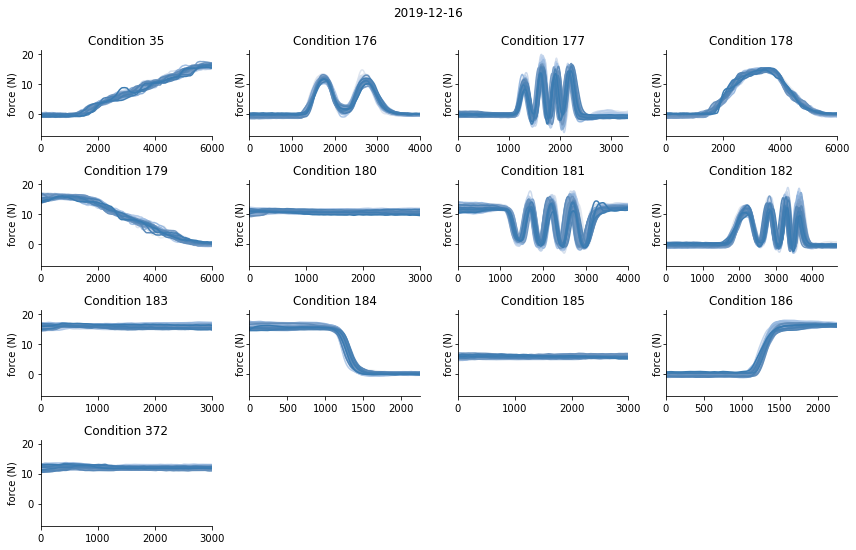

In [36]:
# plot good trial forces for 2019-12-16
# "labels" dictionary maps attributes to formatted text
session_key = {'session_date': '2019-12-16'}

dataviz.plot_table(
    pacman_behavior.Force
        & session_key
        & (pacman_processing.GoodTrial & 'good_trial'),
    'force_filt', group_by=('condition_id',), stack_by=('trial',),
    axes=dict(sharey=True), 
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', force_filt='force (N)')
)

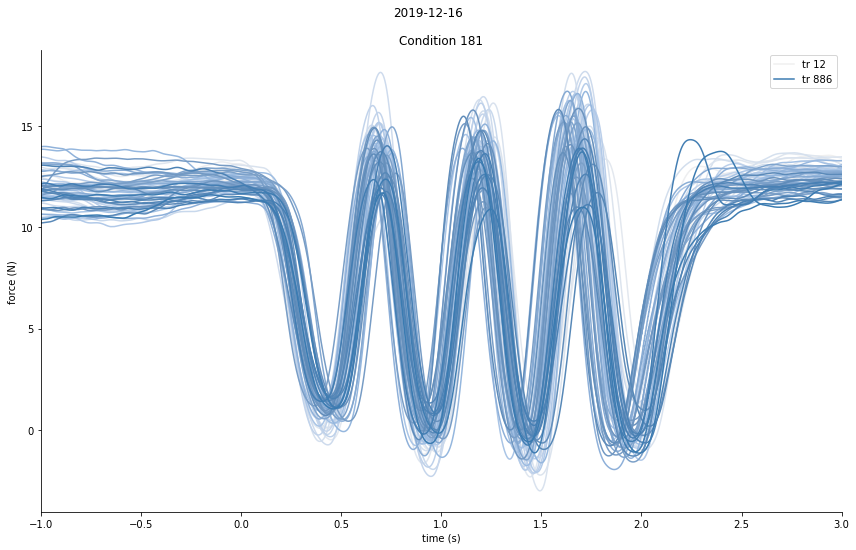

In [26]:
# plot trials for 2 Hz sinusoid with legend (only first and last trials)
# join with Condition table to plot actual condition time
dataviz.plot_table(
    pacman_behavior.Force * pacman_acquisition.Behavior.Condition
        & session_key
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial'),
    'force_filt', x='condition_time', group_by=('condition_id',), stack_by=('trial',),
    axes=dict(sharey=True, show_legend=True, sparse_legend=True), 
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', force_filt='force (N)', trial='tr {}', condition_time='time (s)')
)

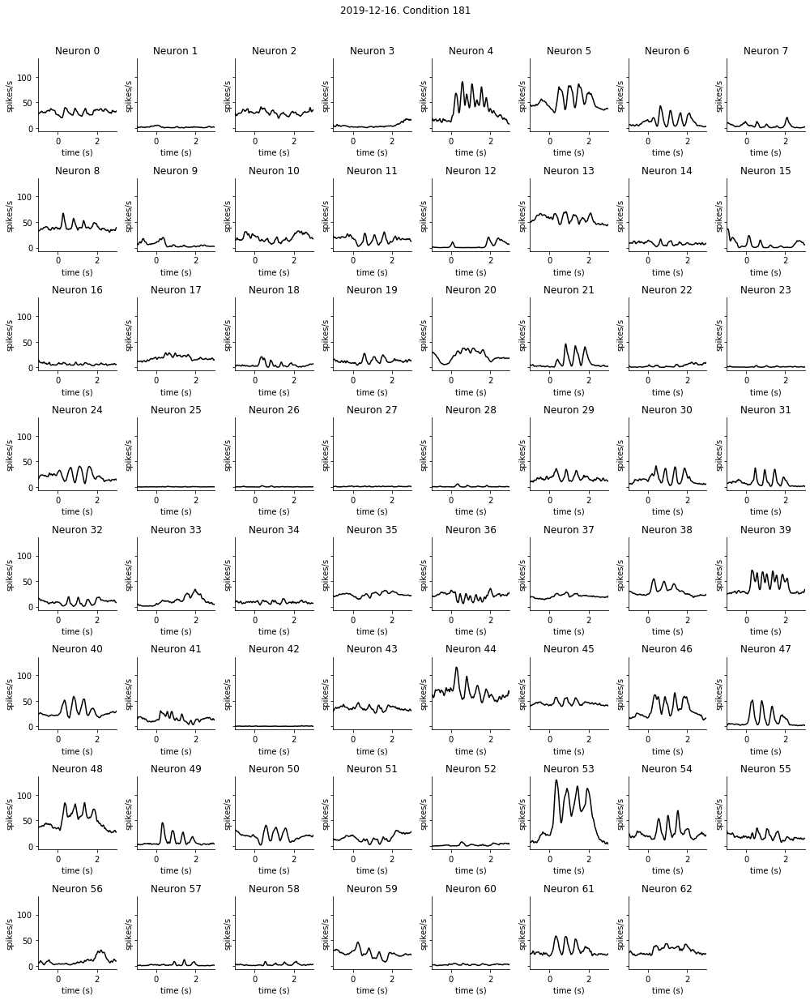

In [27]:
# plot neuron PSTHs for 2 Hz sinusoid
# set color to black for all traces
# note figures/subplots/lines autolimited; can be overriden
dataviz.plot_table(
    pacman_brain.NeuronPsth * pacman_acquisition.Behavior.Condition
        & session_key
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial'),
    'neuron_psth', x='condition_time', group_by=('neuron_id',),
    axes=dict(sharey=True), style=dict(color='k'), layout=dict(limit_subplots=None, figsize=(14,18)),
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', neuron_psth='spikes/s', neuron_id='Neuron {}', condition_time='time (s)')
)

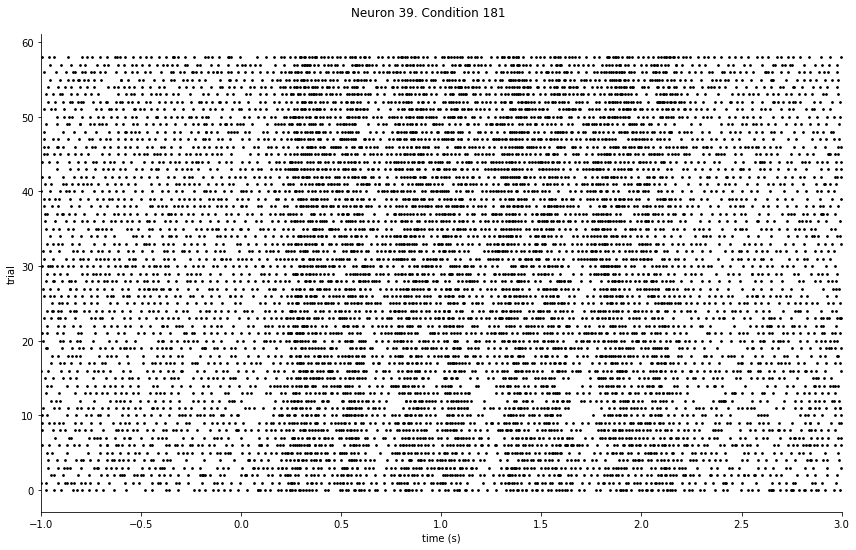

In [33]:
# plot spike raster for neuron 39 (40th neuron -- 0 indexing) from 2 Hz sinusoidal condition from 2019-12-16
dataviz.plot_table(
    pacman_brain.NeuronSpikeRaster * pacman_acquisition.Behavior.Condition
        & session_key
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial')
        & {'neuron_id': 39},
    'neuron_spike_raster', x='condition_time', stack_by=('trial',),
    style=dict(kind='raster', color='k'),
    labels=dict(session_id=r'Session {}', condition_id=r'Condition {}', neuron_spike_raster='trial', neuron_id='Neuron {}', condition_time='time (s)')
)

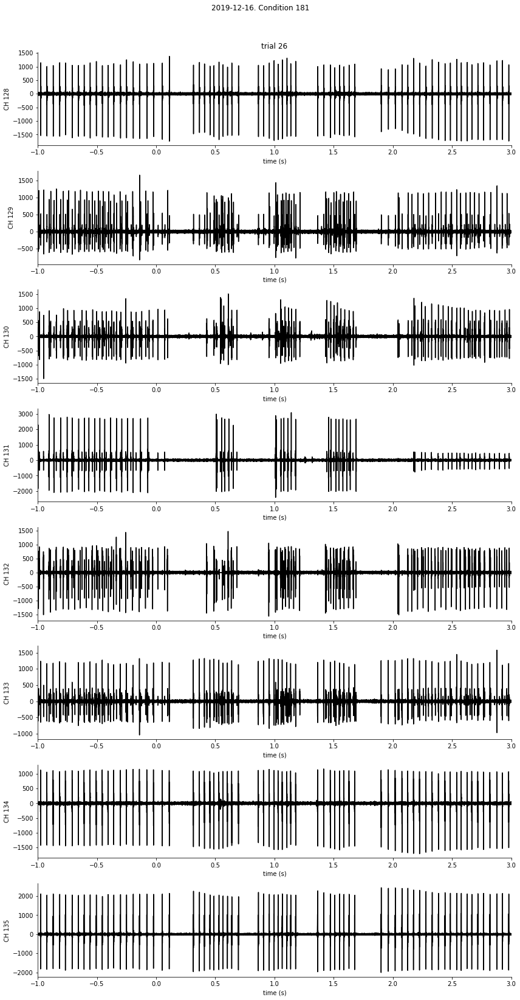

In [34]:
# plot random EMG trial
# map highpass Butterworth to y-data
table = pacman_muscle.Emg * pacman_acquisition.Behavior.Condition \
    & session_key \
    & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2}) \
    & (pacman_processing.GoodTrial & 'good_trial')

trials = (dj.U('trial') & table).fetch('KEY')

butter_hp500 = (processing.Filter.Butterworth & {'low_cut': 500}).filter

dataviz.plot_table(table & np.random.choice(trials,1),
    'emg_signal', x='condition_time', map_fcn=butter_hp500, map_args=(3e4,),
    style=dict(color='k'), layout=dict(grid_attr=('ephys_channel_idx','trial'), figsize=(12,24)),
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', trial='trial {}', ephys_channel_idx='CH {}', condition_time='time (s)')
)

In [42]:
# plot random neuron from 2019-12-16 template
# seems to be some issue with the templates...
neuron_id = np.random.choice((processing.Neuron & session_key).fetch('neuron_id',as_dict=True), 1)
print(neuron_id)

[{'neuron_id': 58}]


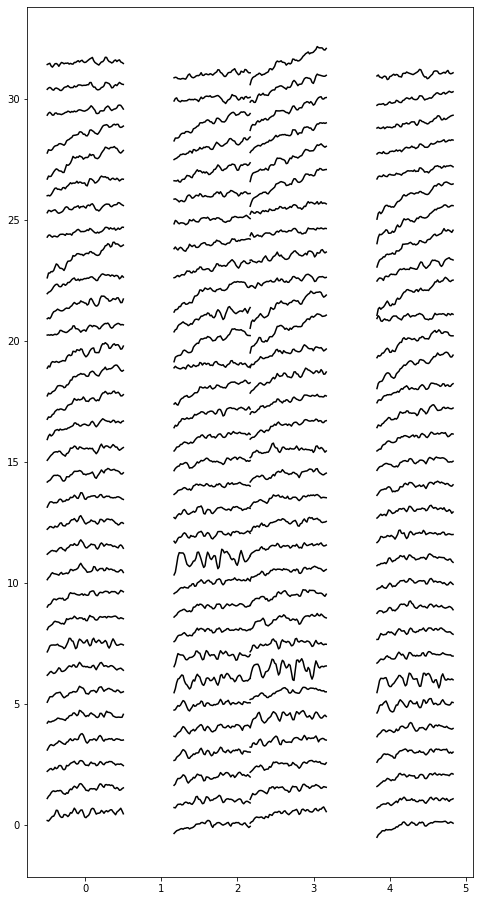

In [43]:
(processing.Neuron.Template & session_key & neuron_id).plot()

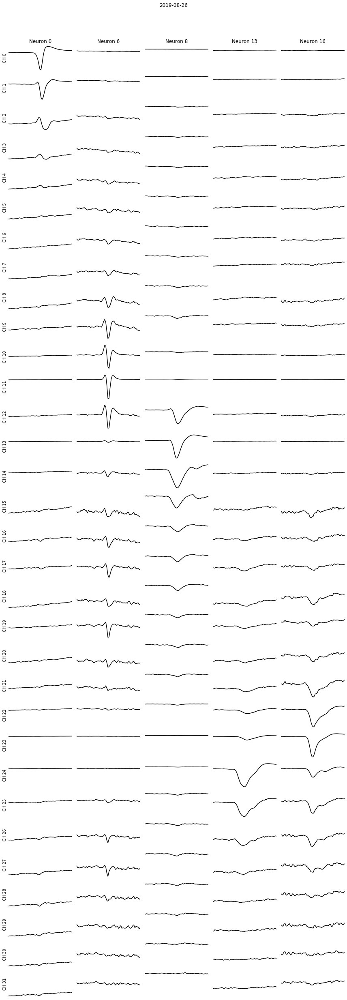

In [44]:
# try plotting a few templates from an S-Probe day
# note we ignore the ephys_channel_idx attribute here since we've joined with the electrode array model 
# and use the electrode_idx (sorted by physical position on the probe) to set the layout
s_probe_session = np.random.choice((acquisition.BrainChannelGroup & {'electrode_array_model': 'S-Probe'}).fetch('KEY'), 1)[0]
neuron_ids = np.random.choice((processing.Neuron & s_probe_session).fetch('neuron_id',as_dict=True), 5, replace=False)

dataviz.plot_table(
    processing.Neuron.Template * acquisition.BrainChannelGroup * equipment.ElectrodeArrayConfig.Electrode & s_probe_session & neuron_ids,
        'neuron_template', ignore=('ephys_channel_idx',),
    axes=dict(sharey='row'),
    style=dict(color='k', remove_spines=('top','right','bottom','left'), show_x_ticks=False, show_y_ticks=False),
    layout=dict(grid_attr=('electrode_idx', 'neuron_id'), figsize=(12,36)),
    labels=dict(session_date=r'{}', electrode_idx=r'CH {}', neuron_id=r'Neuron {}')
)

## Various table methods

### Filtering

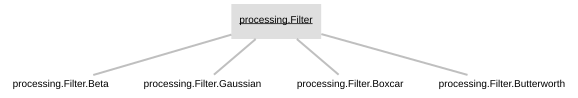

In [45]:
# each filter part table has an associated filter method
dj.ERD(processing.Filter) + 1 - dj.ERD(pacman_processing.FilterParams)

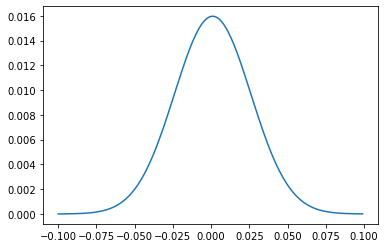

In [46]:
# plot delta function with 25 ms Gaussian
fs = 1e3
x = np.arange(-0.1, 0.1, 1/fs).round(3)
y = np.zeros(x.shape)
y[x==0] = 1
plt.figure()
plt.plot(x, (processing.Filter.Gaussian & {'sd': 25e-3, 'width': 4}).filter(y, fs));

In [ ]:
# ideal if each filter ID is unique across all part tables
# use insertpart to insert master/part entries
datajointutils.insertpart(processing.Filter, 'Gaussian', sd=10e-3)

In [47]:
processing.Filter.Gaussian()

"filter_id filter ID number (for proper functionality, ensure uniqueness across all part tables)",sd filter standard deviation (s),width filter width (multiples of sd)
0,0.025000000,4


In [ ]:
# if you don't want it
# key = (processing.Filter.Gaussian & {'sd': 10e-3}).fetch1('KEY')
# (processing.Filter & key).delete()

### File paths

In [48]:
# project full file path for behavior or ephys files
acquisition.EphysRecording & {'session_date': '2020-01-06'}

session_date session date,monkey monkey name,ephys_recording_sample_rate ephys sample rate (Hz),ephys_recording_duration ephys recording duration (s),ephys_recording_path path to ephys file directory
2020-01-06,Cousteau,30000,7274.093533333334,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2020-01-06/blackrock/


In [49]:
acquisition.EphysRecording.File & {'session_date': '2020-01-06'}

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,ephys_file_path ephys recording file path (relative to ephys recording directory),ephys_file_name ephys recording file name,ephys_file_extension ephys recording file extension
2020-01-06,Cousteau,0,,pacman-task_c_200106_neu_emg_001,ns6


In [51]:
# use proj_file_path to project the full file path (relative to u19 server) into table
(acquisition.EphysRecording.File & {'session_date': '2020-01-06'}).proj_file_path()

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,ephys_file_path calculated attribute
2020-01-06,Cousteau,0,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2020-01-06/blackrock/pacman-task_c_200106_neu_emg_001.ns6


In [52]:
# same for behavior files
acquisition.BehaviorRecording.File & {'session_date': '2020-01-06'}

session_date session date,monkey monkey name,behavior_file_id behavior recording file ID number,behavior_file_path behavior recording file path (relative to behavior recording directory),behavior_file_name behavior recording file name,behavior_file_extension behavior recording file extension
2020-01-06,Cousteau,0,,pacman-task_c_200106_beh,summary
2020-01-06,Cousteau,1,,pacman-task_c_200106_beh_0001,data
2020-01-06,Cousteau,2,,pacman-task_c_200106_beh_0001,params
2020-01-06,Cousteau,3,,pacman-task_c_200106_beh_0002,data


In [53]:
(acquisition.BehaviorRecording.File & {'session_date': '2020-01-06'}).proj_file_path()

session_date session date,monkey monkey name,behavior_file_id behavior recording file ID number,behavior_file_path calculated attribute
2020-01-06,Cousteau,0,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2020-01-06/speedgoat/pacman-task_c_200106_beh.summary
2020-01-06,Cousteau,1,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2020-01-06/speedgoat/pacman-task_c_200106_beh_0001.data
2020-01-06,Cousteau,2,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2020-01-06/speedgoat/pacman-task_c_200106_beh_0001.params
2020-01-06,Cousteau,3,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2020-01-06/speedgoat/pacman-task_c_200106_beh_0002.data


### DataJoint utilities

In [54]:
# get part tables for a given table
datajointutils.get_parts(processing.Filter)

[churchland_pipeline_python.processing.Filter.Beta,
 churchland_pipeline_python.processing.Filter.Boxcar,
 churchland_pipeline_python.processing.Filter.Butterworth,
 churchland_pipeline_python.processing.Filter.Gaussian]

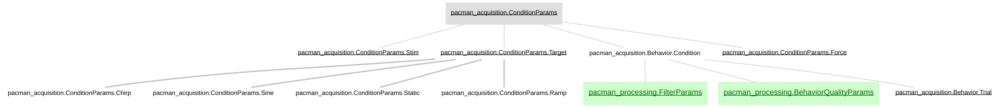

In [55]:
# note ConditionParams has several part tables and other (non-part) child tables
dj.ERD(pacman_acquisition.ConditionParams) + 2

In [56]:
# join a table with its part tables (restrict with optional key)
# with depth=1, this joins ConditionParams with the first level part tables
joined_table, part_tables = datajointutils.join_parts(pacman_acquisition.ConditionParams, {'condition_id': 0}, depth=1)

In [57]:
# the identified part tables
part_tables

[pacman_pipeline_python.pacman_acquisition.ConditionParams,
 pacman_pipeline_python.pacman_acquisition.ConditionParams.Force,
 pacman_pipeline_python.pacman_acquisition.ConditionParams.Target]

In [58]:
# the join of all the part tables
joined_table

condition_id condition ID number,force_id force ID number,target_id target ID number,force_max maximum force (N),force_offset baseline force (N),force_inverted whether pushing on the load cell moves PacMan up (False) or down (True) onscreen,target_duration target duration (s),target_offset target offset from baseline (proportion playable window),"target_pad_pre duration of ""padding"" dots preceding target force profile (s)","target_pad_post duration of ""padding"" dots following target force profile (s)"
0,0,0,16,-0.1400,0,4.0000,0.0000,0.7000,0.7000


In [59]:
# joining all part tables up to 2 layers
joined_table, part_tables = datajointutils.join_parts(pacman_acquisition.ConditionParams, {'condition_id': 0}, depth=2)

In [60]:
part_tables

[pacman_pipeline_python.pacman_acquisition.ConditionParams,
 pacman_pipeline_python.pacman_acquisition.ConditionParams.Force,
 pacman_pipeline_python.pacman_acquisition.ConditionParams.Target,
 pacman_pipeline_python.pacman_acquisition.ConditionParams.Ramp]

In [61]:
joined_table

condition_id condition ID number,force_id force ID number,target_id target ID number,force_max maximum force (N),force_offset baseline force (N),force_inverted whether pushing on the load cell moves PacMan up (False) or down (True) onscreen,target_duration target duration (s),target_offset target offset from baseline (proportion playable window),"target_pad_pre duration of ""padding"" dots preceding target force profile (s)","target_pad_post duration of ""padding"" dots following target force profile (s)",target_amplitude target amplitude (proportion playable window)
0,0,0,16,-0.1400,0,4.0000,0.0000,0.7000,0.7000,1.0000


In [62]:
# querying a table with exact attribute/key values
equipment.ElectrodeArray & {'electrode_array_model': 'Neuropixels', 'electrode_array_model_version': 'nhp demo', 'electrode_array_id': 0}

electrode_array_model electrode array model name,electrode_array_model_version electrode array model version,electrode_array_id electrode array ID number,electrode_array_serial electrode array serial number
Neuropixels,nhp demo,0,


In [63]:
# a quicker alternative (matches the primary keys to the ordered tuple of attribute values)
query, key = datajointutils.match_fuzzy_key(equipment.ElectrodeArray, ('Neuropixels', 'nhp demo', 0))

In [64]:
query

electrode_array_model electrode array model name,electrode_array_model_version electrode array model version,electrode_array_id electrode array ID number,electrode_array_serial electrode array serial number
Neuropixels,nhp demo,0,


In [65]:
key

{'electrode_array_model': 'Neuropixels',
 'electrode_array_model_version': 'nhp demo',
 'electrode_array_id': 0}

In [66]:
# works with fewer attributes (but not guaranteed to return a length-1 query)
query, key = datajointutils.match_fuzzy_key(equipment.ElectrodeArray, 'Neuropixels')

In [67]:
query

electrode_array_model electrode array model name,electrode_array_model_version electrode array model version,electrode_array_id electrode array ID number,electrode_array_serial electrode array serial number
Neuropixels,nhp demo,0,


In [68]:
key

{'electrode_array_model': 'Neuropixels',
 'electrode_array_model_version': 'nhp demo',
 'electrode_array_id': 0}